Se cargan las librerías a utilizar
- Pandas para la carga y el procesado de datasets
- Matplotlib para la creación de visualizaciones como gráficos de barras.
- Seaborn para la creación de visualizaciones como gráficos de correlación
- Geopandas para el tratado con datos geoespaciales
- Matplotlib.patheffects Para la decoración de gráficos

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import geopandas as gpd
import matplotlib.patheffects as patheffects

Se cargan los datos .csv

In [2]:
%config InlineBackend.figure_format='retina'

In [3]:
url_data = 'https://raw.githubusercontent.com/bcarom/TViz-Examen/main/Data/Nivel_educacional.csv'
data = pd.read_csv(url_data, sep= ';')
data.head()

,Código,Comunas,Sala cuna o jardín infantil,Prekínder,Kínder,Especial o diferencial,Educación básica,Primaria o preparatoria (sistema antiguo),Científico-humanista,Técnica profesional,...,Incivilidades,Abigeato,Abusos sexuales y otros delitos sexuales,Violencia intrafamiliar,Receptación,Robo frustrado,Total Delitos,Total Hombres,Total Mujeres,Total Habitantes
0,13101,SANTIAGO,7 518,3 475,4 972,667,44 180,4 193,70 595,40 080,...,41 442,0,323,2 183,475,253,77 188,206 678,291 817,498 495
1,13102,CERRILLOS,2 179,1 151,1 586,449,18 816,2 357,17 919,12 695,...,2 043,0,47,615,66,80,6 319,39 631,41 201,80 832
2,13103,CERRO NAVIA,3 380,1 799,2 687,823,37 041,5 850,30 988,23 442,...,1 918,0,88,797,69,20,5 389,65 438,67 184,132 622
3,13104,CONCHALÍ,2 894,1 715,2 393,719,27 292,5 571,32 717,17 797,...,2 543,0,73,636,75,47,7 224,61 877,65 078,126 955
4,13105,EL BOSQUE,3 990,2 331,3 510,1 080,41 379,6 073,37 267,27 152,...,3 875,0,103,938,76,104,9 956,79 372,83 133,162 505


In [4]:
education_columns = [
    'Sala cuna o jardín infantil', 'Prekínder', 'Kínder', 'Especial o diferencial',
    'Educación básica', 'Primaria o preparatoria (sistema antiguo)', 'Científico-humanista',
    'Técnica profesional', 'Humanidades (sistema antiguo)',
    'Técnica comercial, industrial/normalista (sistema antiguo)', 
    'Técnico superior (1-3 años)', 'Profesional (4 o más años)', 'Magíster', 'Doctorado'
]

for column in education_columns:
    data[column] = data[column].astype(str).str.replace(' ', '').astype(int)

# Crear la nueva columna para el total de educación
data['Total Educación'] = data[education_columns].sum(axis=1)

# Definir las columnas relacionadas con delitos
crime_columns = [
    'Delitos de mayor connotación social', 'Infracción a ley de armas', 'Incivilidades',
    'Abigeato', 'Abusos sexuales y otros delitos sexuales', 'Violencia intrafamiliar',
    'Receptación', 'Robo frustrado'
]

# Asegurar que las columnas relacionadas con delitos sean tratadas como cadenas antes de la conversión
for column in crime_columns:
    data[column] = data[column].astype(str).str.replace(' ', '').astype(int)

# Crear la nueva columna para el total de delitos
data['Total Delitos'] = data[crime_columns].sum(axis=1)

data.head()

,Código,Comunas,Sala cuna o jardín infantil,Prekínder,Kínder,Especial o diferencial,Educación básica,Primaria o preparatoria (sistema antiguo),Científico-humanista,Técnica profesional,...,Abigeato,Abusos sexuales y otros delitos sexuales,Violencia intrafamiliar,Receptación,Robo frustrado,Total Delitos,Total Hombres,Total Mujeres,Total Habitantes,Total Educación
0,13101,SANTIAGO,7518,3475,4972,667,44180,4193,70595,40080,...,0,323,2183,475,253,77188,206 678,291 817,498 495,384017
1,13102,CERRILLOS,2179,1151,1586,449,18816,2357,17919,12695,...,0,47,615,66,80,6319,39 631,41 201,80 832,75511
2,13103,CERRO NAVIA,3380,1799,2687,823,37041,5850,30988,23442,...,0,88,797,69,20,5389,65 438,67 184,132 622,123214
3,13104,CONCHALÍ,2894,1715,2393,719,27292,5571,32717,17797,...,0,73,636,75,47,7224,61 877,65 078,126 955,118301
4,13105,EL BOSQUE,3990,2331,3510,1080,41379,6073,37267,27152,...,0,103,938,76,104,9956,79 372,83 133,162 505,152467


Para las visualizaciones básicas, se normalizan la población de educación y criminalidad por el total de habiantes de cada comuna
para poder tener datos representativos.

In [5]:
# Normalizar las columnas Total Educación y Total Delitos por el total de habitantes
data['Total Habitantes'] = data['Total Habitantes'].astype(str).str.replace(' ', '').astype(int)

data['Porcentaje Educación'] = data['Total Educación'] / data['Total Habitantes']*100
data['Porcentaje Delitos'] = data['Total Delitos'] / data['Total Habitantes']*100

print(data[['Comunas', 'Total Educación', 'Total Delitos', 'Total Habitantes', 'Porcentaje Educación', 'Porcentaje Delitos']].head())


       Comunas  Total Educación  Total Delitos  Total Habitantes  \
0     SANTIAGO           384017          77188            498495   
1    CERRILLOS            75511           6319             80832   
2  CERRO NAVIA           123214           5389            132622   
3     CONCHALÍ           118301           7224            126955   
4    EL BOSQUE           152467           9956            162505   

   Porcentaje Educación  Porcentaje Delitos  
0             77.035276           15.484207  
1             93.417211            7.817449  
2             92.906154            4.063428  
3             93.183411            5.690205  
4             93.822959            6.126581  


Para visualizar los datos se escogieron las columnas del total de educación como población y se normaliza con el total de habitantes por comuna.
Se realizó lo mismo con los datos de todas las columnas de criminalidad.


In [6]:
data['Porcentaje Educación'].describe()

count    52.000000
mean     93.325247
std       2.755020
min      77.035276
25%      93.002083
50%      93.446153
75%      94.193306
max      96.445623
Name: Porcentaje Educación, dtype: float64

In [7]:
data['Porcentaje Delitos'].describe()

count    52.000000
mean      7.095514
std       2.801913
min       4.063428
25%       5.226706
50%       6.399237
75%       7.859336
max      17.943538
Name: Porcentaje Delitos, dtype: float64

Obteniendo una descripción simple de los datos de los datos a visualizar. los porcentajes muestran la cantidad de personas que han sido educada, sin importar el tipo de educación, por cada 100 habitantes. y el porcentaje de criminalidad muestra la cantidad de crímenes que ocurres (sin importar el tipo de crimen) por cada 100 habitantes.

In [8]:
# %Delitos
fig1, ax1 = plt.subplots(figsize=(16, 10), dpi=300)
sorted_total_crimes = data.sort_values(by='Porcentaje Delitos', ascending=False)
sns.barplot(x='Porcentaje Delitos', y='Comunas', data=sorted_total_crimes, palette='copper', ax=ax1)
ax1.set_title('Porcentaje Delitos por Comuna', fontsize=16)
ax1.set_xlabel('Porcentaje Delitos [%]', fontsize=12)
ax1.set_ylabel('')
plt.tight_layout()
for p in ax1.patches:
    width = p.get_width()
    plt.text(width, p.get_y() + p.get_height() / 2,
             '{:1.2f}'.format(width),
             ha='left', va='center', color='black', fontweight='bold')
# plt.savefig('Porcentaje_educación.png', dpi=300, bbox_inches='tight') #Comentaré todos los savefig por si lo compila, para que no le descargue de más
plt.show()

# %Educación
fig2, ax2 = plt.subplots(figsize=(16, 10), dpi=300)
sorted_ed = data.sort_values(by='Porcentaje Educación', ascending=False)
sns.barplot(x='Porcentaje Educación', y='Comunas', data=sorted_ed, palette='copper', ax=ax2)
ax2.set_title('Porcentaje Educación por Comuna', fontsize=16)
ax2.set_xlabel('Porcentaje Educación [%]', fontsize=12)
ax2.set_ylabel('')
plt.tight_layout()
for p in ax2.patches:
    width = p.get_width()
    plt.text(width, p.get_y() + p.get_height() / 2,
             '{:1.2f}'.format(width),
             ha='left', va='center', color='black', fontweight='bold')
# plt.savefig('Porcentaje_Criminalidad.png', dpi=300, bbox_inches='tight') 
plt.show()


C:\Users\Bruno Caro\AppData\Local\Temp\ipykernel_30572\1124047486.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Porcentaje Delitos', y='Comunas', data=sorted_total_crimes, palette='copper', ax=ax1)


C:\Users\Bruno Caro\AppData\Local\Temp\ipykernel_30572\1124047486.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Porcentaje Educación', y='Comunas', data=sorted_ed, palette='copper', ax=ax2)


Aparte de los porcentajes como datos duros, se realiza una normalización simple por cantidad de habitantes en los delitos cometidos,
en los tipos de educación, para de esta manera desglosar el tipo de delitos o educación en las primeras 10 comunas del dataset. esto para identificar patrones y obtener ideas del comportamiento de manera más precisa.

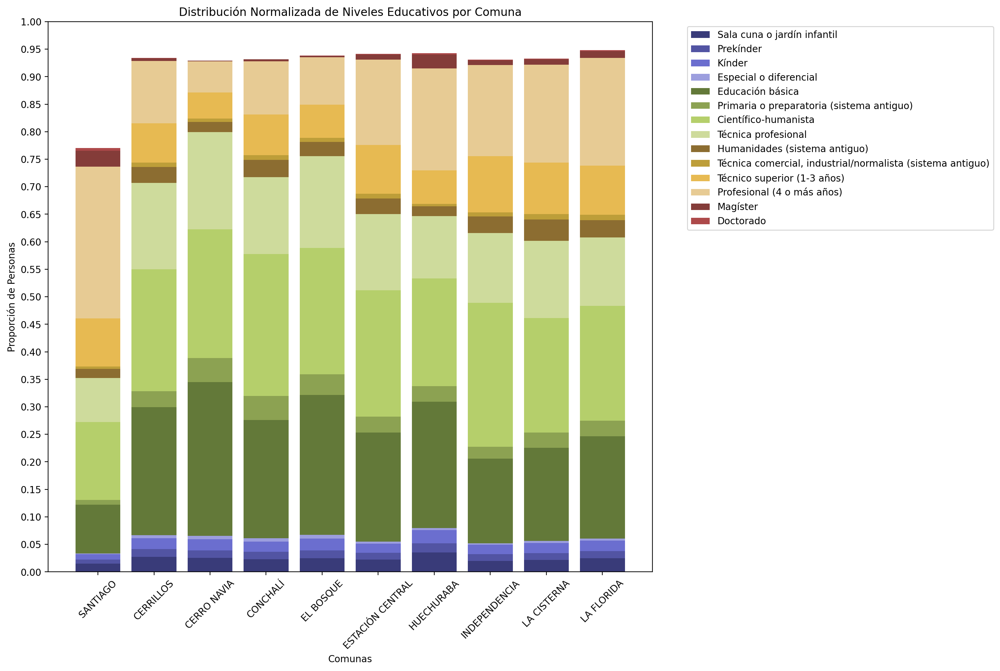

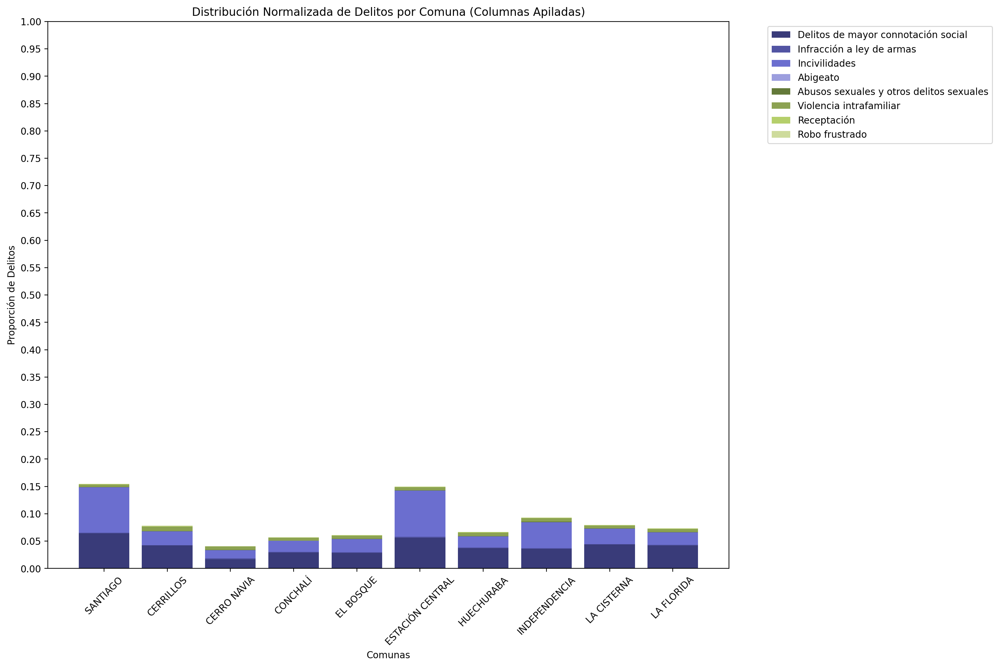

In [9]:
# Seleccionar las primeras 10 comunas para la visualización
selected_comunas = data.head(10)

# Definir una paleta de colores que no se repita
colors_education = sns.color_palette("tab20b", len(education_columns))
colors_crime = sns.color_palette("tab20b", len(crime_columns))

# Gráfico de columnas apiladas para niveles educativos normalizados
plt.figure(figsize=(15, 10))

bottom = pd.Series([0] * len(selected_comunas))

for i, column in enumerate(education_columns):
    plt.bar(selected_comunas['Comunas'], selected_comunas[column] / selected_comunas['Total Habitantes'], bottom=bottom, color=colors_education[i], label=column)
    bottom += selected_comunas[column] / selected_comunas['Total Habitantes']

plt.xlabel('Comunas')
plt.ylabel('Proporción de Personas')
plt.title('Distribución Normalizada de Niveles Educativos por Comuna')
plt.xticks(rotation=45)
plt.yticks([i * 0.05 for i in range(21)])  # Subdivisiones del eje Y en 0.05
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
# plt.savefig('Columnas_Apiladas_educación.png')
plt.show()

# Gráfico de columnas apiladas para delitos normalizados
plt.figure(figsize=(15, 10))

bottom = pd.Series([0] * len(selected_comunas))

for i, column in enumerate(crime_columns):
    plt.bar(selected_comunas['Comunas'], selected_comunas[column] / selected_comunas['Total Habitantes'], bottom=bottom, color=colors_crime[i], label=column)
    bottom += selected_comunas[column] / selected_comunas['Total Habitantes']

plt.xlabel('Comunas')
plt.ylabel('Proporción de Delitos')
plt.title('Distribución Normalizada de Delitos por Comuna (Columnas Apiladas)')
plt.xticks(rotation=45)
plt.yticks([i * 0.05 for i in range(21)])  # Subdivisiones del eje Y en 0.05
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
# plt.savefig('Columnas_Apiladas_Delitos.png')
plt.show()


Con esto se visualiza de manera simple las comunas mayor y menor porcentaje de criminalidad y educación.

Ahora para las visualizaciones de alta complejidad, Se realizarán visualizaciones tipo heatmap para los delitos en las comunas.
luego una clusterización para poder ver relaciones entre las comunas
y para ver la relación entre educación y delitos en la comunas, se realizará una correlación y un mapa de calor para ver las relaciones.
Finalmente se realizará un mapa de coropletas con los porcentajes de delitos y las comunas extremas en este porcentaje.

In [10]:
# Asegurar que las columnas relacionadas con delitos sean tratadas como cadenas antes de la conversión
for column in crime_columns:
    data[column] = data[column].astype(str).str.replace(' ', '').astype(int)

# Crear la nueva columna para el total de delitos
data['Total Delitos'] = data[crime_columns].sum(axis=1)

# Convertir la columna Total Habitantes a enteros
data['Total Habitantes'] = data['Total Habitantes'].astype(str).str.replace(' ', '').astype(int)

# Normalizar todas las columnas de delitos por el total de habitantes
for column in crime_columns:
    data[f'{column} Normalizado'] = data[column] / data['Total Habitantes']

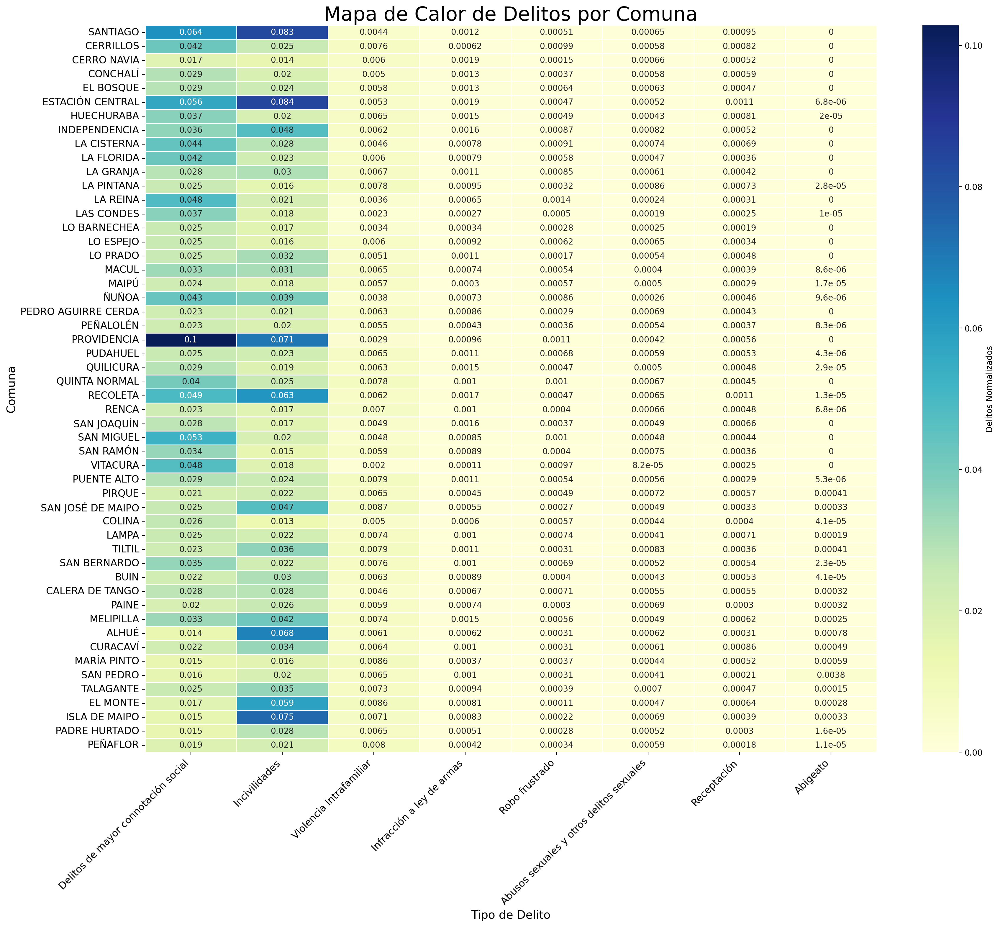

In [11]:
# Ordenar las columnas de delitos por la cantidad total de delitos de ese tipo
total_delitos_por_tipo = data[crime_columns].sum().sort_values(ascending=False)
ordered_crime_columns = total_delitos_por_tipo.index.tolist()

# Crear un DataFrame para el mapa de calor con las columnas ordenadas
heatmap_data_ordered = data.set_index('Comunas')[[f'{column} Normalizado' for column in ordered_crime_columns]]

# Configurar el tamaño de la figura
plt.figure(figsize=(20, 16))

# Crear el mapa de calor con las columnas ordenadas y sin "Normalizado" en los nombres de los delitos
heatmap_data_ordered.columns = [col.replace(' Normalizado', '') for col in heatmap_data_ordered.columns]
sns.heatmap(heatmap_data_ordered, cmap='YlGnBu', annot=True, linewidths=.5, cbar_kws={'label': 'Delitos Normalizados'})

# Configurar los títulos y etiquetas con tamaños de fuente mejorados
plt.title('Mapa de Calor de Delitos por Comuna', fontsize=24)
plt.xlabel('Tipo de Delito', fontsize=14)
plt.ylabel('Comuna', fontsize=14)
plt.xticks(rotation=45, ha='right', fontsize=12)
plt.yticks(fontsize=12)


# Mostrar el mapa de calor
# plt.savefig('MapaDeCalor_Comunas.png', bbox_inches='tight') 
plt.show()


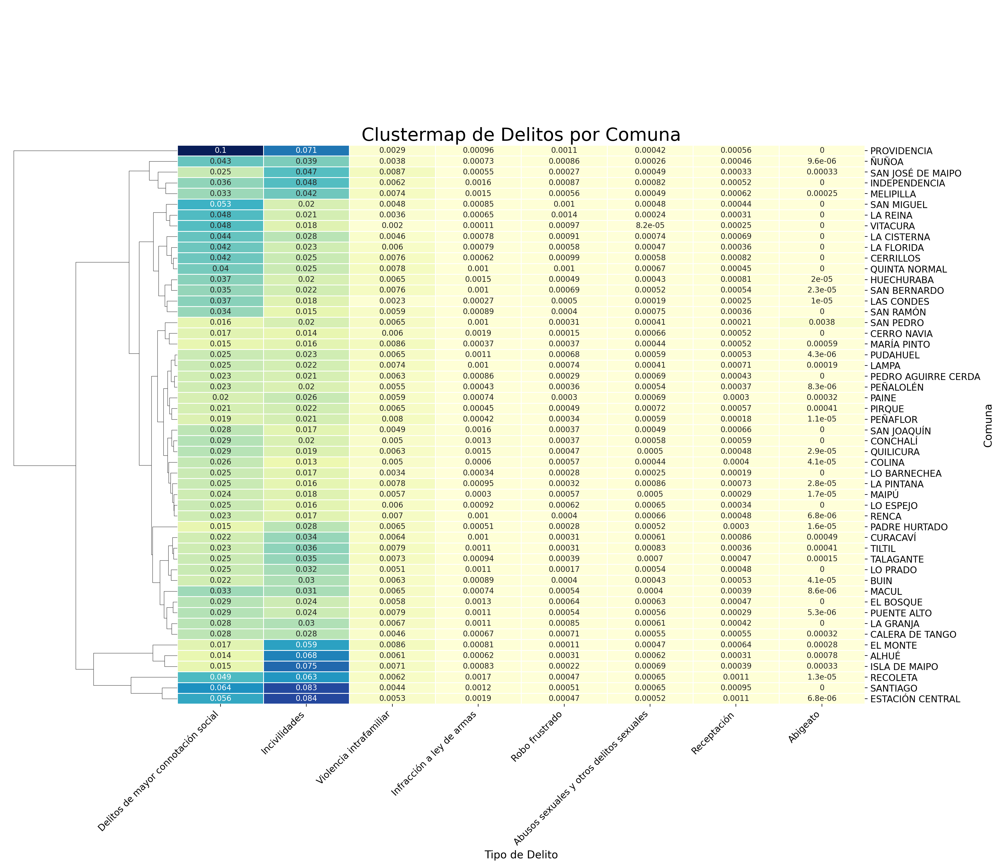

In [12]:
# Crear el clustermap para clusterizar solo las comunas
clustermap = sns.clustermap(heatmap_data_ordered, cmap='YlGnBu', annot=True, linewidths=.5, figsize=(18,16), 
                            col_cluster=False, cbar=None, cbar_pos=None)

# Configurar los títulos y etiquetas con tamaños de fuente mejorados
plt.title('Clustermap de Delitos por Comuna', fontsize=24)
clustermap.ax_heatmap.set_xlabel('Tipo de Delito', fontsize=14)
clustermap.ax_heatmap.set_ylabel('Comuna', fontsize=14)
clustermap.ax_heatmap.set_xticklabels(clustermap.ax_heatmap.get_xticklabels(), rotation=45, ha='right', fontsize=12)
clustermap.ax_heatmap.set_yticklabels(clustermap.ax_heatmap.get_yticklabels(), fontsize=12)

# Mostrar el clustermap
# plt.savefig('Clusterización_Delitos_Comunas.png')
plt.show()


Para el mapa, nos basamos en la agrupación por distritos.
obtenidos de: https://github.com/daniopitz/visualizacion/blob/main/clases_practicas/clase08_actividades.ipynb
agrupando de esta manera, los datos trabajados anteriormente visualizados en un mapa.

In [13]:
# Preparar los datos para el mapa
# Asegurarnos de que ambos datasets tengan el código de las comunas correcto para la fusión
index_data = data[['Código', 'Comunas',  'Porcentaje Delitos', 'Total Habitantes']]
index_data

,Código,Comunas,Porcentaje Delitos,Total Habitantes
0,13101,SANTIAGO,15.484207,498495
1,13102,CERRILLOS,7.817449,80832
2,13103,CERRO NAVIA,4.063428,132622
3,13104,CONCHALÍ,5.690205,126955
4,13105,EL BOSQUE,6.126581,162505
5,13106,ESTACIÓN CENTRAL,14.987657,147041
6,13107,HUECHURABA,6.694976,98671
7,13108,INDEPENDENCIA,9.311834,100281
8,13109,LA CISTERNA,7.984998,90119
9,13110,LA FLORIDA,7.337102,366916


In [14]:
print(index_data.columns)

Index(['Código', 'Comunas', 'Porcentaje Delitos', 'Total Habitantes'], dtype='object')


In [15]:
index_data['Código'] = index_data['Código'].astype(int)

C:\Users\Bruno Caro\AppData\Local\Temp\ipykernel_30572\881874369.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  index_data['Código'] = index_data['Código'].astype(int)


In [16]:
index_data = index_data.set_index('Código')

In [17]:
index_data

,Comunas,Porcentaje Delitos,Total Habitantes
Código,,,
13101,SANTIAGO,15.484207,498495
13102,CERRILLOS,7.817449,80832
13103,CERRO NAVIA,4.063428,132622
13104,CONCHALÍ,5.690205,126955
13105,EL BOSQUE,6.126581,162505
13106,ESTACIÓN CENTRAL,14.987657,147041
13107,HUECHURABA,6.694976,98671
13108,INDEPENDENCIA,9.311834,100281
13109,LA CISTERNA,7.984998,90119


<Axes: >

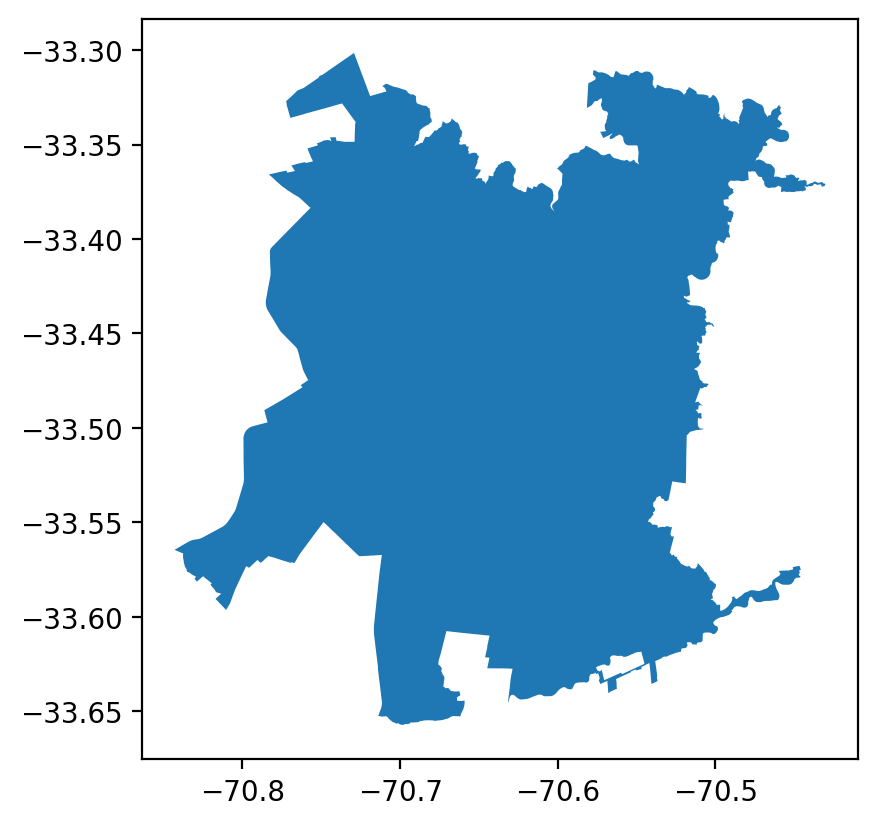

In [18]:
#No pude cargar el raw, supongo que no es csv y por eso no se puede ver :c (está en el github)
urban_stgo = gpd.read_file(r"C:\Users\Bruno Caro\Desktop\Progra\Tviz\Certamen02\censo2017\censo2017\urban_stgo_border\urban_stgo_border.shp")

# Establecer el sistema de referencia de coordenadas inicial
urban_stgo = urban_stgo.set_crs('EPSG:4326')
urban_stgo.plot()

In [19]:
distritos = gpd.read_file(r"C:\Users\Bruno Caro\Desktop\Progra\Tviz\Examen\Data\R13")
distritos


,REGION,PROVINCIA,COMUNA,COD_DISTRI,DESC_REGIO,DESC_PROVI,DESC_COMUN,DESC_DISTR,geometry
0,13,131,13114,4.0,REGIÓN METROPOLITANA DE SANTIAGO,SANTIAGO,LAS CONDES,LAS CONDES,"POLYGON ((-70.47951 -33.36433, -70.47940 -33.3..."
1,13,131,13114,15.0,REGIÓN METROPOLITANA DE SANTIAGO,SANTIAGO,LAS CONDES,SAN CARLOS DE APOQUINDO,"POLYGON ((-70.50074 -33.37846, -70.50045 -33.3..."
2,13,131,13114,16.0,REGIÓN METROPOLITANA DE SANTIAGO,SANTIAGO,LAS CONDES,CERRO CALÁN,"POLYGON ((-70.50789 -33.38245, -70.50774 -33.3..."
3,13,131,13114,2.0,REGIÓN METROPOLITANA DE SANTIAGO,SANTIAGO,LAS CONDES,ESTADIO PALESTINO,"POLYGON ((-70.53606 -33.38529, -70.53652 -33.3..."
4,13,131,13114,3.0,REGIÓN METROPOLITANA DE SANTIAGO,SANTIAGO,LAS CONDES,HOSPITAL FACH,"POLYGON ((-70.54504 -33.39658, -70.54575 -33.3..."
...,...,...,...,...,...,...,...,...,...
446,13,135,13501,1.0,REGIÓN METROPOLITANA DE SANTIAGO,MELIPILLA,MELIPILLA,MELIPILLA PONIENTE,"POLYGON ((-71.22747 -33.67002, -71.22402 -33.6..."
447,13,135,13501,7.0,REGIÓN METROPOLITANA DE SANTIAGO,MELIPILLA,MELIPILLA,CULIPRÁN,"POLYGON ((-71.19488 -33.78527, -71.19403 -33.7..."
448,13,135,13501,13.0,REGIÓN METROPOLITANA DE SANTIAGO,MELIPILLA,MELIPILLA,PUANGUE PONIENTE,"POLYGON ((-71.31653 -33.58829, -71.31629 -33.5..."
449,13,135,13501,8.0,REGIÓN METROPOLITANA DE SANTIAGO,MELIPILLA,MELIPILLA,HUECHÚN,"POLYGON ((-71.32236 -33.66578, -71.32134 -33.6..."


In [20]:
# Convertir las columnas a enteros
distritos['REGION'] = distritos['REGION'].astype(int)
distritos['PROVINCIA'] = distritos['PROVINCIA'].astype(int)
distritos['COMUNA'] = distritos['COMUNA'].astype(int)
distritos['COD_DISTRI'] = distritos['COD_DISTRI'].astype(int)

# Obtener la longitud del GeoDataFrame
distritos_len= len(distritos)
print(distritos_len)

451


CRS de distritos transformado: EPSG:4326
CRS de urban_stgo: EPSG:4326


<Axes: >

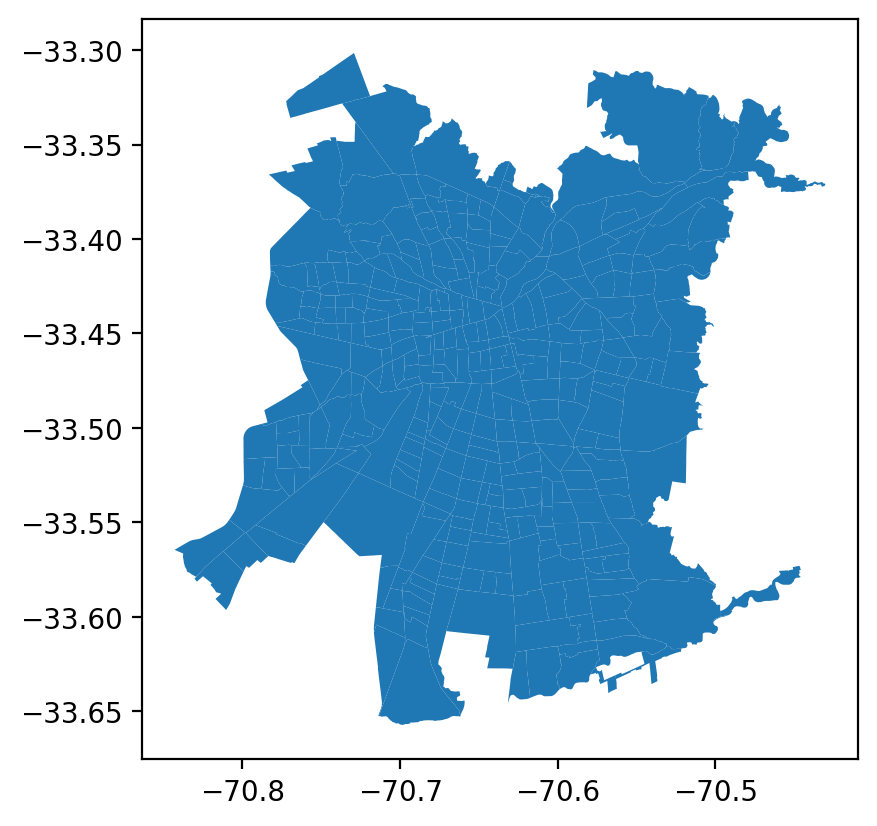

In [21]:
# Transformar el CRS de distritos a EPSG:4326
distritos = distritos.to_crs('EPSG:4326')

# Verificar que ambos GeoDataFrames tienen el mismo CRS
print("CRS de distritos transformado:", distritos.crs)
print("CRS de urban_stgo:", urban_stgo.crs)

# Realizar la intersección
urban_districts = gpd.overlay(distritos, urban_stgo, how='intersection')

# Hacer el gráfico de la intersección
urban_districts.plot()

In [22]:
urban_data = urban_districts.merge(index_data, left_on='COMUNA', right_on='Código', how='inner')

In [23]:
urban_data

,REGION,PROVINCIA,COMUNA,COD_DISTRI,DESC_REGIO,DESC_PROVI,DESC_COMUN,DESC_DISTR,FID,geometry,Comunas,Porcentaje Delitos,Total Habitantes
0,13,131,13114,4,REGIÓN METROPOLITANA DE SANTIAGO,SANTIAGO,LAS CONDES,LAS CONDES,0,"POLYGON ((-70.47940 -33.36434, -70.47931 -33.3...",LAS CONDES,5.812344,294838
1,13,131,13114,15,REGIÓN METROPOLITANA DE SANTIAGO,SANTIAGO,LAS CONDES,SAN CARLOS DE APOQUINDO,0,"POLYGON ((-70.50045 -33.37855, -70.50037 -33.3...",LAS CONDES,5.812344,294838
2,13,131,13114,16,REGIÓN METROPOLITANA DE SANTIAGO,SANTIAGO,LAS CONDES,CERRO CALÁN,0,"POLYGON ((-70.50774 -33.38250, -70.50764 -33.3...",LAS CONDES,5.812344,294838
3,13,131,13114,2,REGIÓN METROPOLITANA DE SANTIAGO,SANTIAGO,LAS CONDES,ESTADIO PALESTINO,0,"POLYGON ((-70.53652 -33.38549, -70.53657 -33.3...",LAS CONDES,5.812344,294838
4,13,131,13114,3,REGIÓN METROPOLITANA DE SANTIAGO,SANTIAGO,LAS CONDES,HOSPITAL FACH,0,"POLYGON ((-70.54575 -33.39769, -70.54613 -33.3...",LAS CONDES,5.812344,294838
...,...,...,...,...,...,...,...,...,...,...,...,...,...
342,13,136,13604,1,REGIÓN METROPOLITANA DE SANTIAGO,TALAGANTE,PADRE HURTADO,CASA DE EJERCICIOS,0,"POLYGON ((-70.80540 -33.55063, -70.80288 -33.5...",PADRE HURTADO,5.113043,63250
343,13,136,13604,3,REGIÓN METROPOLITANA DE SANTIAGO,TALAGANTE,PADRE HURTADO,PADRE HURTADO,0,"POLYGON ((-70.79794 -33.55565, -70.79794 -33.5...",PADRE HURTADO,5.113043,63250
344,13,136,13604,4,REGIÓN METROPOLITANA DE SANTIAGO,TALAGANTE,PADRE HURTADO,VILLA LOS SILOS,0,"POLYGON ((-70.82936 -33.57881, -70.82933 -33.5...",PADRE HURTADO,5.113043,63250
345,13,133,13302,4,REGIÓN METROPOLITANA DE SANTIAGO,CHACABUCO,LAMPA,LA VILANA,0,"POLYGON ((-70.72696 -33.32623, -70.72699 -33.3...",LAMPA,5.729463,102034


Aquí se obtiene una visualización final del mapa de la RM, zonas urbanas. Relacionando a cada comuna con su porcentaje de delitos.
Sin embargo, para una mejor visualización se sigue trabajando en él

In [24]:
# Un gráfico de coropletas es útil para mostrar la variación de una variable medida en regiones geográficas.

# Se configura una figura y un eje con Matplotlib, especificando el tamaño de la figura.
fig, ax = plt.subplots(1, 1, figsize=(20, 20), dpi=300)


urban_data.plot(column='Porcentaje Delitos', ax=ax, legend=True, cmap='plasma',
         legend_kwds={'label': "Porcentaje Delitos por comuna",  # Configura la etiqueta de la leyenda
                      'orientation': "horizontal"})  # Establece la orientación de la leyenda como horizontal
plt.title("Mapa de Coropletas del Índice Ponderado Porcentaje de delitos por Comuna en Santiago", fontsize=15)
plt.axis('off')
# Muestra el gráfico.
plt.show()

In [25]:
urban_data['Comunas'] = urban_data['Comunas'].astype(str)

Para ello, se debe de trabajar el método de lectura de las coordenadas, para poder centrar correctamente las etiquetas.
se visualizan las 'peores' y 'mejores' 5 comunas dle indicador

In [26]:
# Reproyectar las geometrías a un CRS proyectado adecuado (por ejemplo, EPSG:32719 para Chile)
urban_data_projected = urban_data.to_crs(epsg=32719)

# Agrupar los datos por comuna y calcular el centroide de cada comuna en el CRS proyectado
urban_data_grouped = urban_data_projected.dissolve(by='DESC_COMUN', as_index=False)
urban_data_grouped['centroid'] = urban_data_grouped.geometry.centroid

# Obtener las comunas con los valores más altos y más bajos del Índice Ponderado Educación-Criminalidad
top_comunas = urban_data_grouped.nlargest(5, 'Porcentaje Delitos')['DESC_COMUN']
bottom_comunas = urban_data_grouped.nsmallest(5, 'Porcentaje Delitos')['DESC_COMUN']

# Unir las comunas con valores extremos, asegurando unicidad
extreme_comunas = set(top_comunas).union(set(bottom_comunas))

# Volver al CRS original para la visualización (opcional)
urban_data_grouped = urban_data_grouped.to_crs(urban_data.crs)

# Crear una figura con alta resolución
fig, ax = plt.subplots(1, 1, figsize=(18, 18), dpi=300)

# Crear el mapa de coropletas
urban_data.plot(column='Porcentaje Delitos', ax=ax, legend=True, cmap='plasma',
                legend_kwds={'label': "Porcentaje de Delitos por comuna", 'orientation': "horizontal"})

# Añadir nombres de las comunas en los extremos con total de habitantes
for idx, row in urban_data_grouped.iterrows():
    if row['DESC_COMUN'] in extreme_comunas:
        centroid = row.geometry.centroid
        x, y = centroid.x, centroid.y
        text = f"{row['DESC_COMUN']}\n{int(row['Total Habitantes']):,} habitantes"
        plt.annotate(text=text, xy=(x, y), xytext=(x, y),
                     ha='center', va='center', fontsize=5, color='black', weight='bold', 
                     path_effects=[
                         patheffects.Stroke(linewidth=3, foreground='white'),
                         patheffects.Normal()])
        extreme_comunas.remove(row['DESC_COMUN'])  # Remover la comuna para que no se anote nuevamente

# Configurar el título y desactivar los ejes
plt.title("Mapa Coropletas del Porcentaje de delitos por Comuna en Santiago", fontsize=15)
plt.axis('off')

# Mostrar el gráfico
# plt.savefig('Coropletas_Porcentaje_Delitos.png')
plt.show()

Resulando en el mapa de coropleta (al hacerle zoom se ven bien las etiquetas (pero se ve bien) :c no las hice más grandes porque sino se superponían), mostrando las 10 comunas extremas al porcentaje de delitos.
Además pusimos el total de habitantes en estas comunas para profundizar la información

Pruebas

In [27]:
# data['Educación Superior'] = data['Técnico superior (1-3 años)'] + data['Profesional (4 o más años)'] + data['Magíster'] + data['Doctorado']
# data['Educación Básica'] = data['Educación básica']

# plt.figure(figsize=(15, 10))
# plt.scatter(data['Educación Básica'], data['Educación Superior'], s=data['Total Habitantes']/100, alpha=0.5)
# plt.xlabel('Educación Básica (Proporción)')
# plt.ylabel('Educación Superior (Proporción)')
# plt.title('Relación entre Educación Básica y Superior por Comuna')
# plt.grid(True)

# for i in range(len(data)):
#     plt.text(data['Educación Básica'].iloc[i], data['Educación Superior'].iloc[i], data['Comunas'].iloc[i], fontsize=9, alpha= 0.5, ha='center')

# plt.tight_layout()
# plt.show()
